In [ ]:
import cv2
video_capture = cv2.VideoCapture('/content/STScI-01EVS1ZKHPCX2YNJR7G588XH4J.mp4')
frame_number = 0

while True:
    ret, frame = video_capture.read()
    if not ret:
        break


    frame_filename = f'frame_{frame_number:04d}.jpg'
    cv2.imwrite(frame_filename, frame)
    frame_number += 1
video_capture.release()

print(f"Frames extracted: {frame_number}")

In [3]:
#loop for frame to frame conversion
for i in range(1, (frame_number)):
  filename = f"frame_{i:03d}.jpg"
  image = cv2.imread(filename)

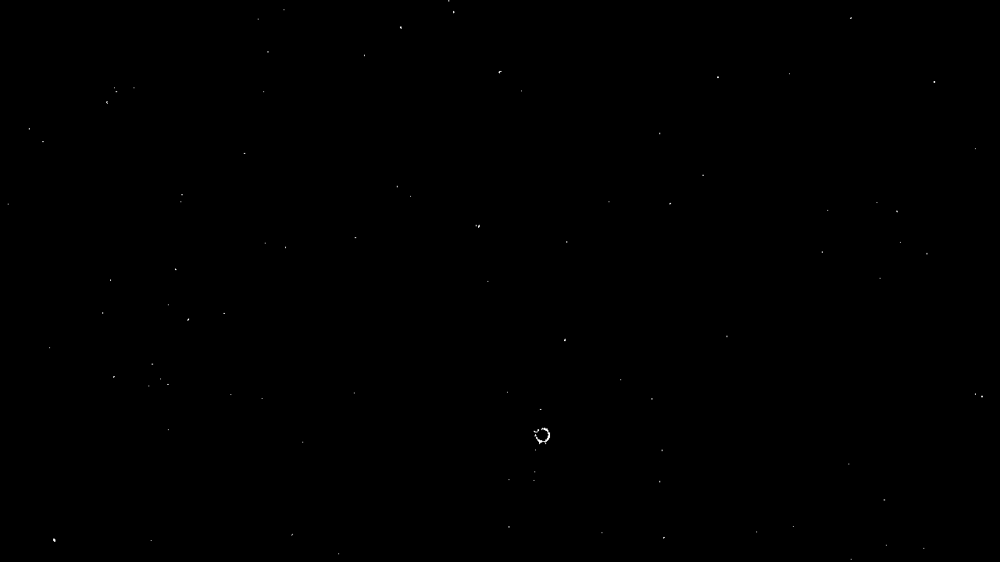

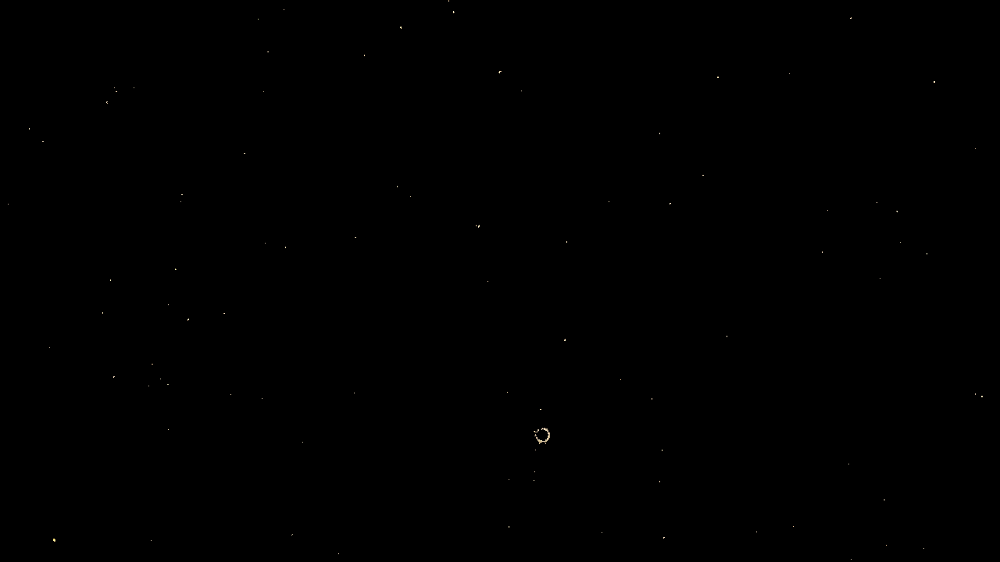

In [4]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# function to make a yellow mask
def mask_yellow(image_path):

    img = cv2.imread(image_path)


    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # get yellows
    lower_yellow = np.array([15, 50, 180])
    upper_yellow = np.array([40, 255, 255])


    mask = cv2.inRange(hsv, lower_yellow, upper_yellow)


    result = cv2.bitwise_and(img, img, mask=mask)

    # display
    cv2_imshow(mask)
    cv2.waitKey(0)
    cv2_imshow(result)
    cv2.waitKey(0)
    cv2.imwrite("masked_image.jpg", mask)
    cv2.destroyAllWindows()


mask_yellow('/content/frame_0000.jpg')

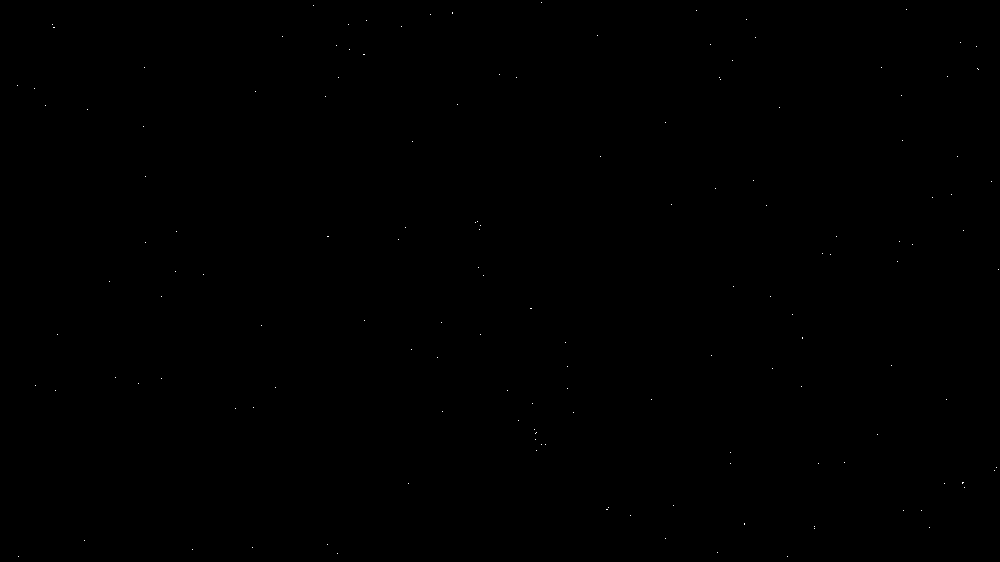

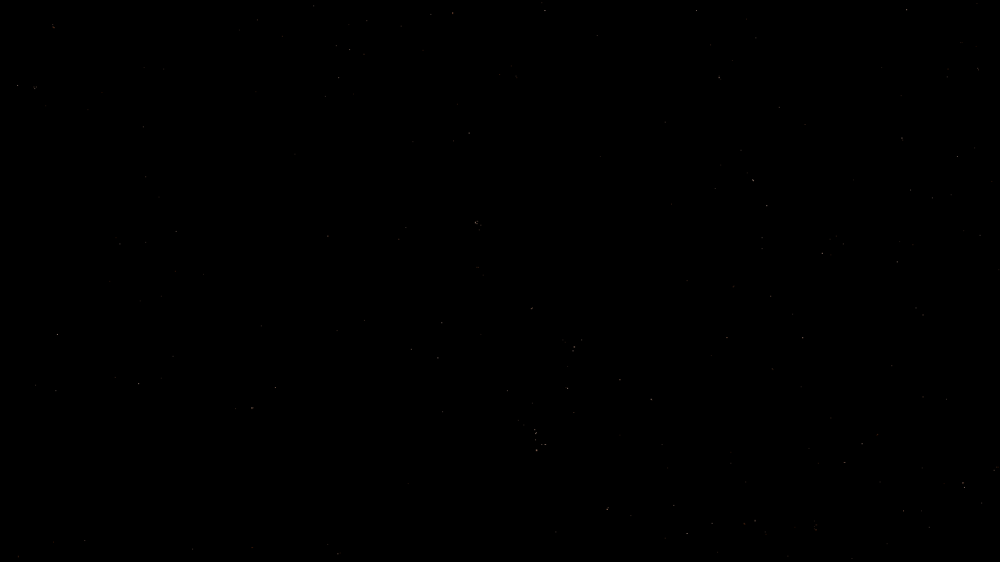

In [5]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow


# same thing but blue
def mask_blue(image_path):

    img = cv2.imread(image_path)


    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    lower_blue = np.array([10, 50, 50])
    upper_blue = np.array([10, 255, 255])


    mask = cv2.inRange(hsv, lower_blue, upper_blue)


    result = cv2.bitwise_and(img, img, mask=mask)


    cv2_imshow(mask)
    cv2.waitKey(0)
    cv2_imshow(result)
    cv2.waitKey(0)
    cv2.imwrite("masked_image1.jpg", mask)
    cv2.destroyAllWindows()

mask_blue('/content/frame_0000.jpg')

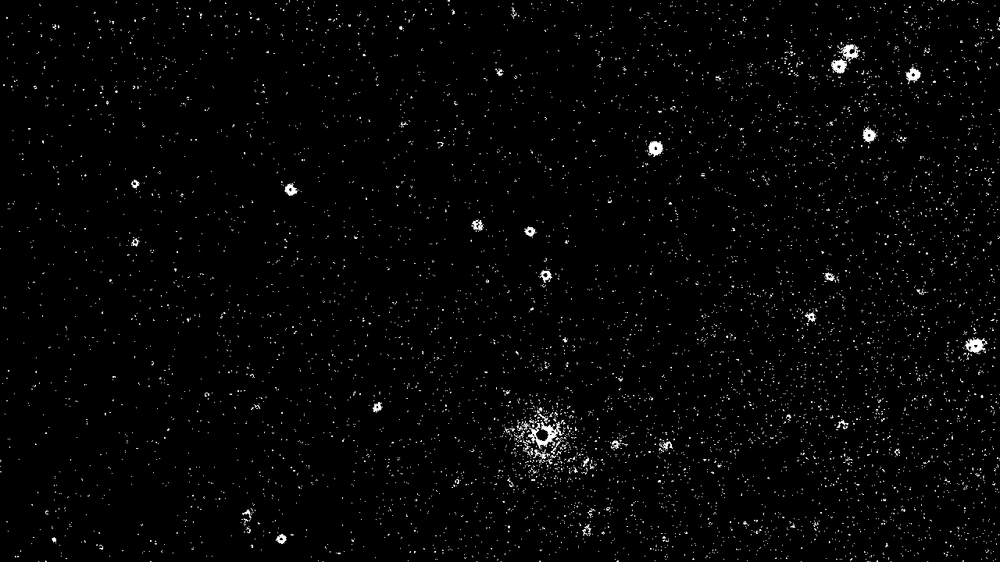

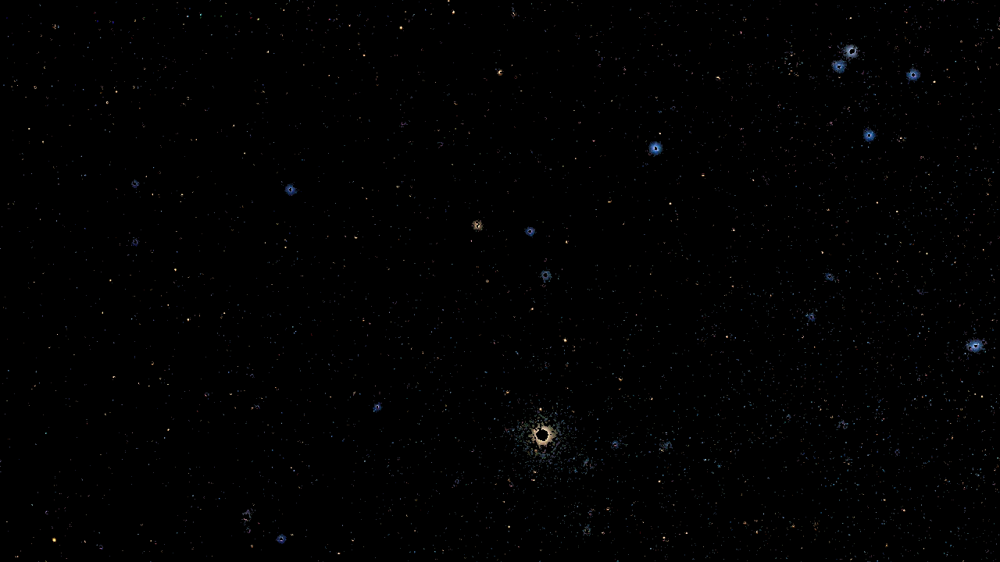

In [6]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

#same thing but red
def mask_red(image_path):

    img = cv2.imread(image_path)


    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)


    lower_red = np.array([10, 50, 50])
    upper_red = np.array([180, 255, 255])


    mask = cv2.inRange(hsv, lower_red, upper_red)

    result = cv2.bitwise_and(img, img, mask=mask)

    cv2_imshow(mask)
    cv2.waitKey(0)
    cv2_imshow(result)
    cv2.waitKey(0)
    cv2.imwrite("masked_image2.jpg", mask)
    cv2.destroyAllWindows()


mask_red('/content/frame_0000.jpg')

In [7]:
!pip install pydub pretty_midi
!apt-get install fluidsynth

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 23.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.3/50.3 kB 6.1 MB/s eta 0:00:00
  Created wheel for pretty_midi: filename=pretty_midi-0.2.10-py3-none-any.whl size=5592287 sha256=a75e1cd04708a5cfda4219fcd184dd2d1df50c46ac8d6f2b21a888842eaecb47
  Stored in directory: /root/.cache/pip/wheels/cd/a5/30/7b8b7f58709f5150f67f98fde4b891ebf0be9ef07a8af49f25
Successfully built pretty_midi
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  fluid-soundfont-gm libevdev2 libfluidsynth3 libgudev-1.0-0 libinput-bin
  libinput10 libinstpatch-1.0-2 libmd4c0 libmtdev1 libqt5core5a libqt5dbus5
  libqt5gui5 libqt5network5 libqt5svg5 libqt5widgets5 libwacom-bin
  libwacom-common libwacom9 libxcb-icccm4 libxcb-image0 libxcb-keysyms1
  libxcb-render-util0 libxcb-util1 libxcb-xinerama0 libxcb-x

In [8]:
import os
import cv2
import pandas as pd
import numpy as np
import matplotlib as plt
import seaborn as sns
import keras.preprocessing.image as ImageDatagenerator
import glob
import cv2
import pickle
import pandas as pd
from scipy.ndimage import label

from keras.models import Sequential, Model
from keras.layers import Conv2D
from keras.applications.vgg16 import VGG16



In [9]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from pydub import AudioSegment
import pretty_midi
import subprocess

# get objects of size > 100

def get_objects(masked_image):
  masked_image = cv2.imread(masked_image)
  gray_image = cv2.cvtColor(masked_image, cv2.COLOR_BGR2GRAY)

  _, binary_image = cv2.threshold(gray_image, 100, 255, cv2.THRESH_BINARY)

  contours = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

  contours = contours[0] if len(contours) == 2 else contours[1]

  min_object_size = 100

  object_areas = []

  for contour in contours:
      x, y, w, h = cv2.boundingRect(contour)
      # Calculate  area of the object
      object_area = w * h



      min_area_threshold = 100


      if object_area >= min_area_threshold:

          cv2.rectangle(masked_image, (x, y), (x + w, y + h), (0, 255, 0), 2)
          size = w * h
          object_areas.append(object_area)
          #print(f"Object found at ({x}, {y}), width: {w}, height: {h} size: {object_area}")
  cv2_imshow(masked_image)
  cv2.waitKey(0)
  cv2.destroyAllWindows()

  return object_areas
#get_objects('/content/masked_image2.jpg')

In [18]:
def merge_dfs_red(df1, df2):
  size_to_midinotes = {
      200: 25,
      400: 29
  }

  merged_df = pd.concat([df1, df2], axis=1)

  merged_df['midinotes'] = merged_df['size'].apply(
      lambda x: next((value for key, value in size_to_midinotes.items() if x < key), 33)
  )

  merged_df.drop(columns=['size'], inplace=True)

  return merged_df

def merge_dfs_yellow(df1, df2):
  size_to_midinotes = {
      200: 13,
      400: 15
  }

  merged_df = pd.concat([df1, df2], axis=1)

  merged_df['midinotes'] = merged_df['size'].apply(
      lambda x: next((value for key, value in size_to_midinotes.items() if x < key), 17)
  )

  merged_df.drop(columns=['size'], inplace=True)

  return merged_df

def merge_dfs_blue(df1, df2):
  size_to_midinotes = {
      200: 50,
      400: 58
  }

  merged_df = pd.concat([df1, df2], axis=1)

  merged_df['midinotes'] = merged_df['size'].apply(
      lambda x: next((value for key, value in size_to_midinotes.items() if x < key), 66)
  )

  merged_df.drop(columns=['size'], inplace=True)

  return merged_df

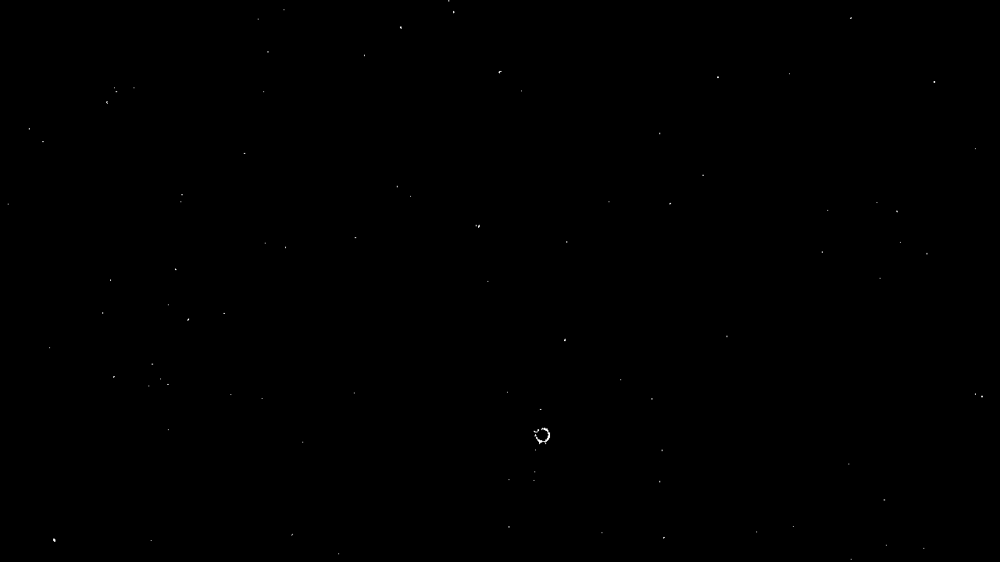

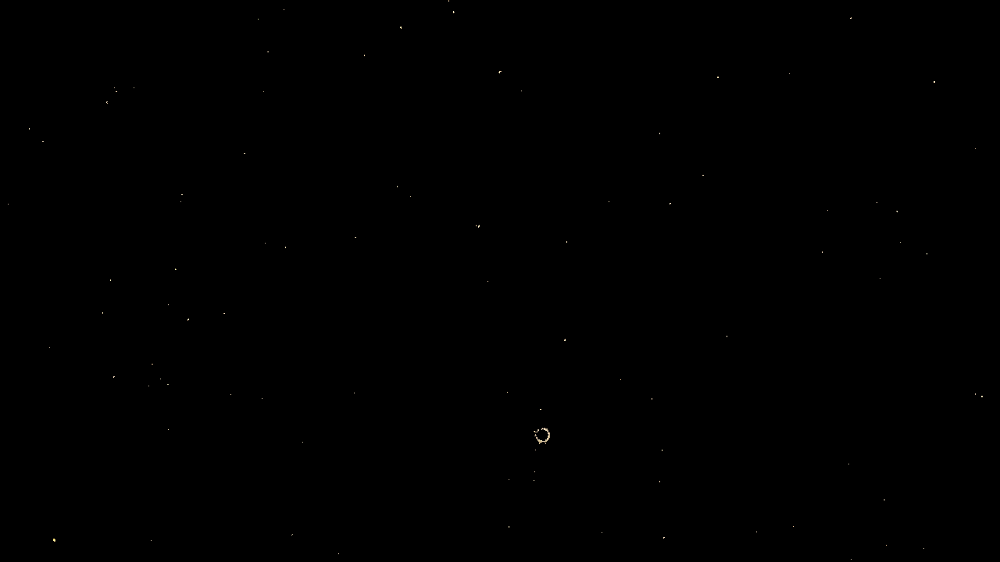

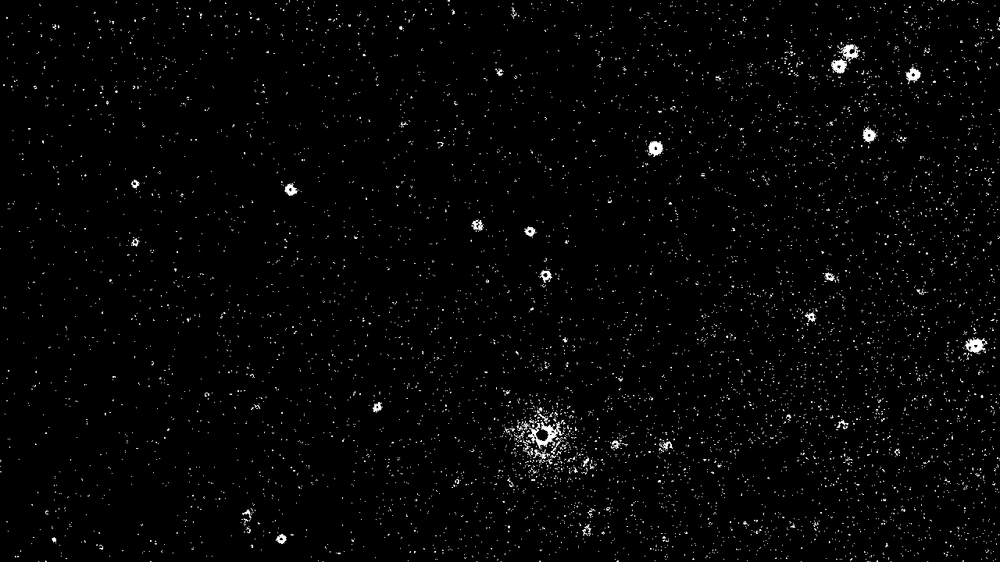

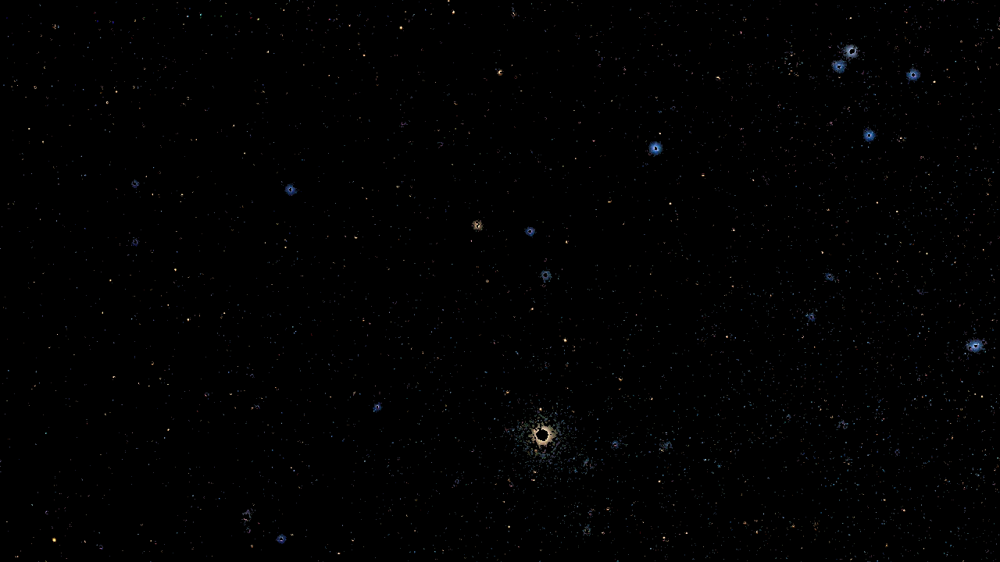

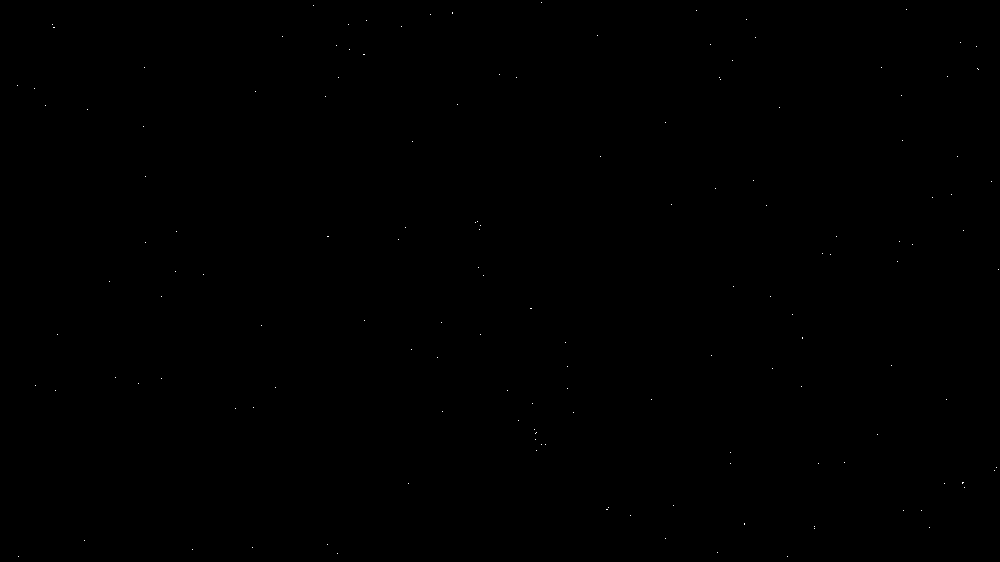

...

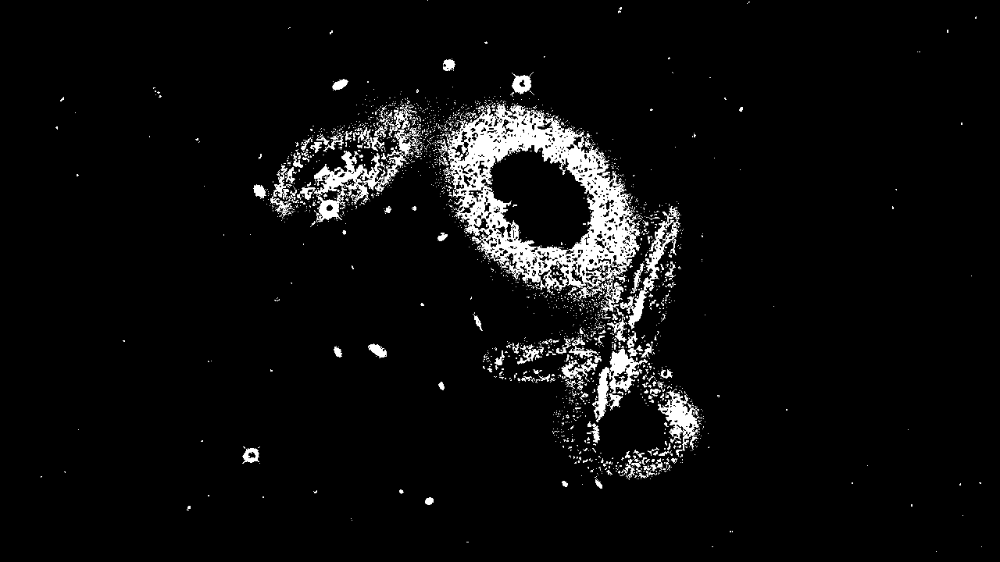

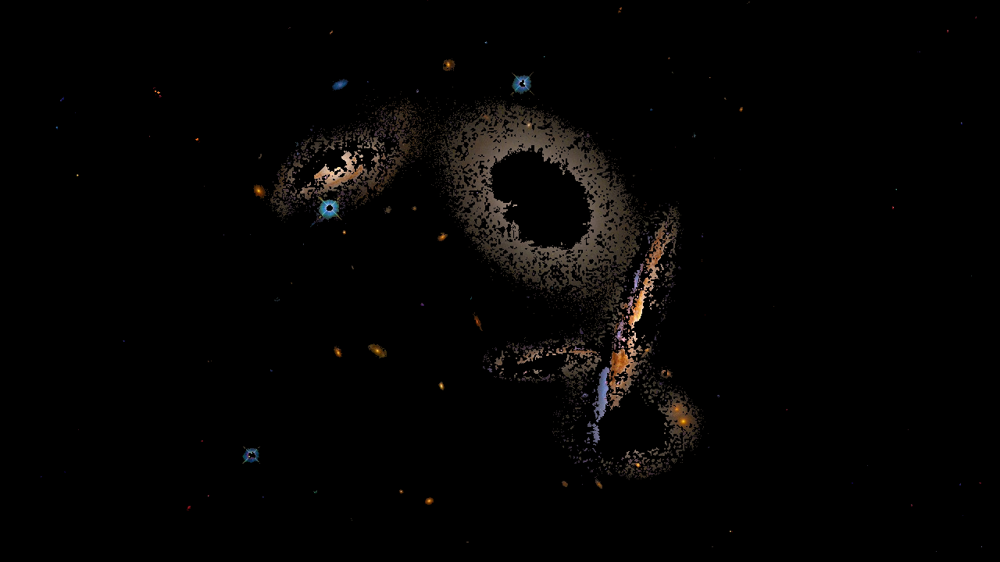

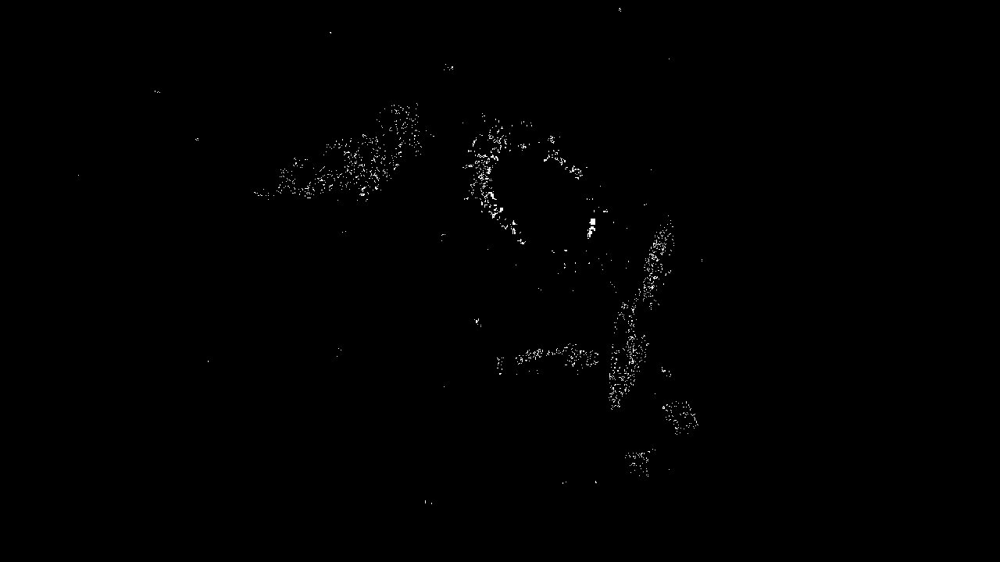

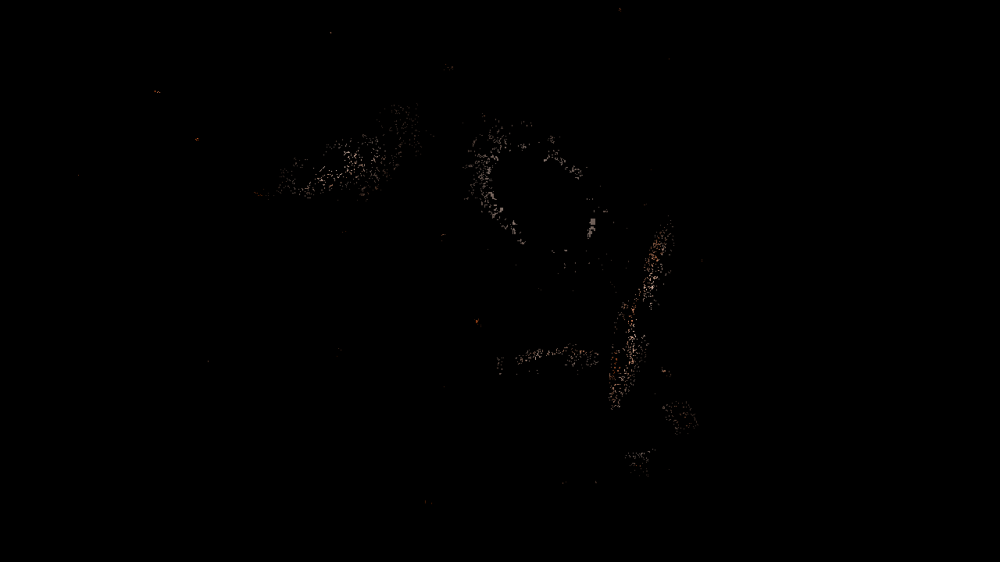

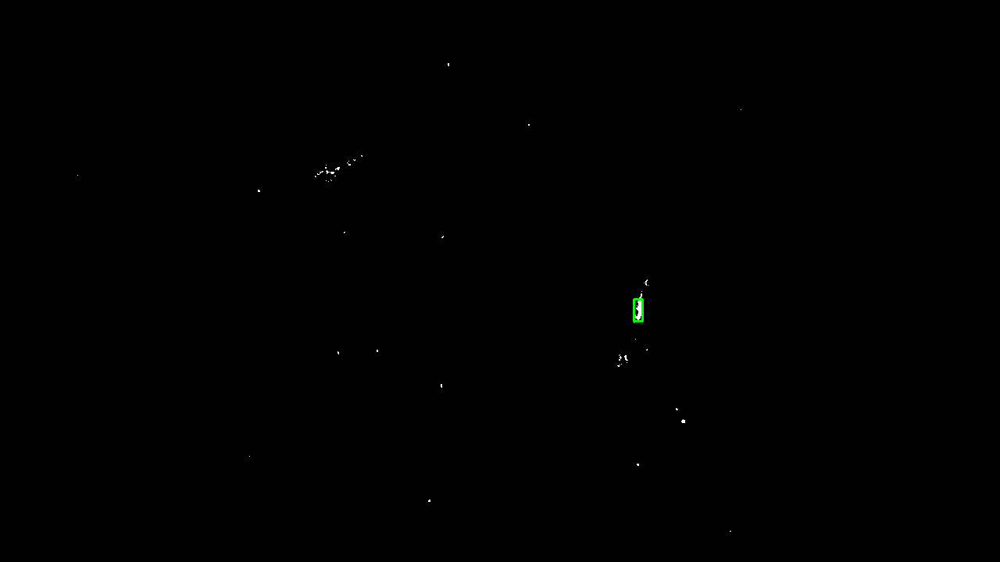

In [16]:
midi_notes=[13, 17, 22] # red / 2
midifreq = np.array(midi_notes)
df1 = pd.DataFrame({"midinotes":midifreq})

midi = pretty_midi.PrettyMIDI()
instrument = pretty_midi.Instrument(0)


for i in range(0, frame_number, 30):
  image_path = f'/content/frame_{i:04d}.jpg'
  mask_yellow(image_path)
  mask_red(image_path)
  mask_blue(image_path)

  def convert_to_audio(masked_image):
    objects = get_objects(masked_image)

    df2 = pd.DataFrame({'size':objects})

    merged_df = merge_dfs_yellow(df1, df2)

    midi_array = merged_df['midinotes'].to_numpy()

    for note in midi_array:
          note_on = pretty_midi.Note(
              velocity=100,
              pitch=note,
              start=i / 30.0,
              end=(i / 30.0) + 1
          )
          instrument.notes.append(note_on)

  convert_to_audio("masked_image.jpg")

midi.instruments.append(instrument)

midi.write('_output-yellow.mid')

subprocess.run(["fluidsynth", "-ni", "FantasyPiano.sf2", "_output-yellow.mid", "-F", "_output-yellow.wav"])

audio = AudioSegment.from_wav("_output-yellow.wav")

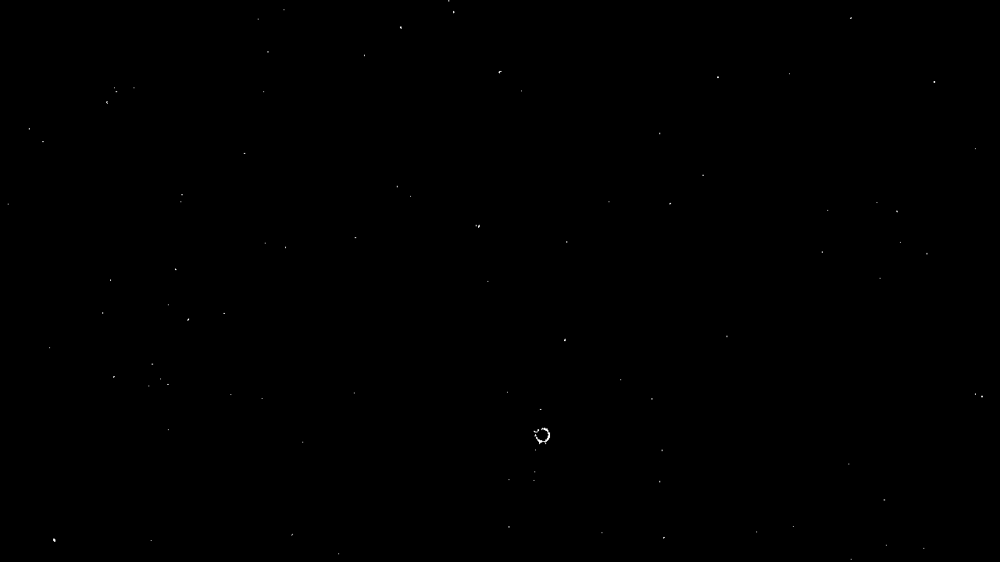

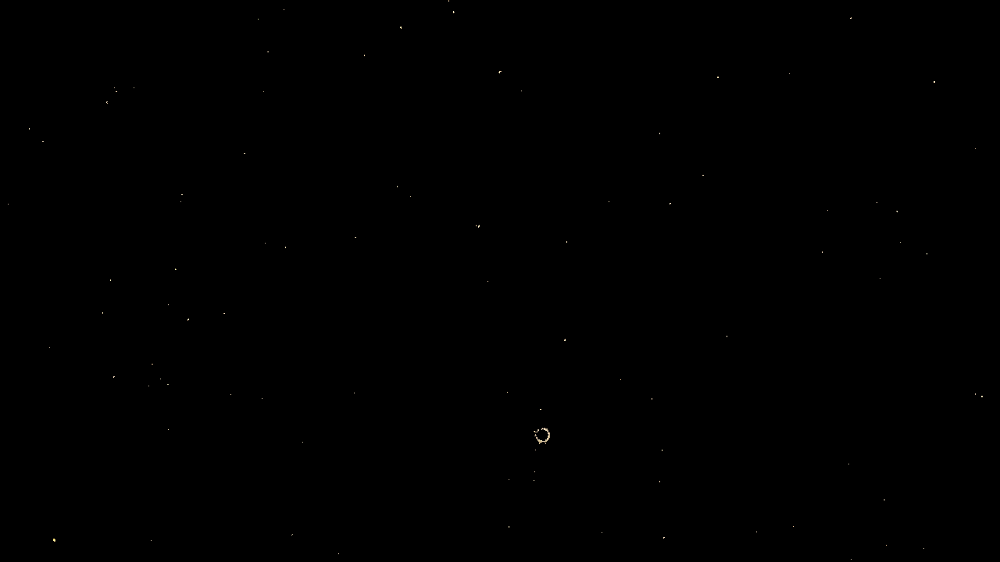

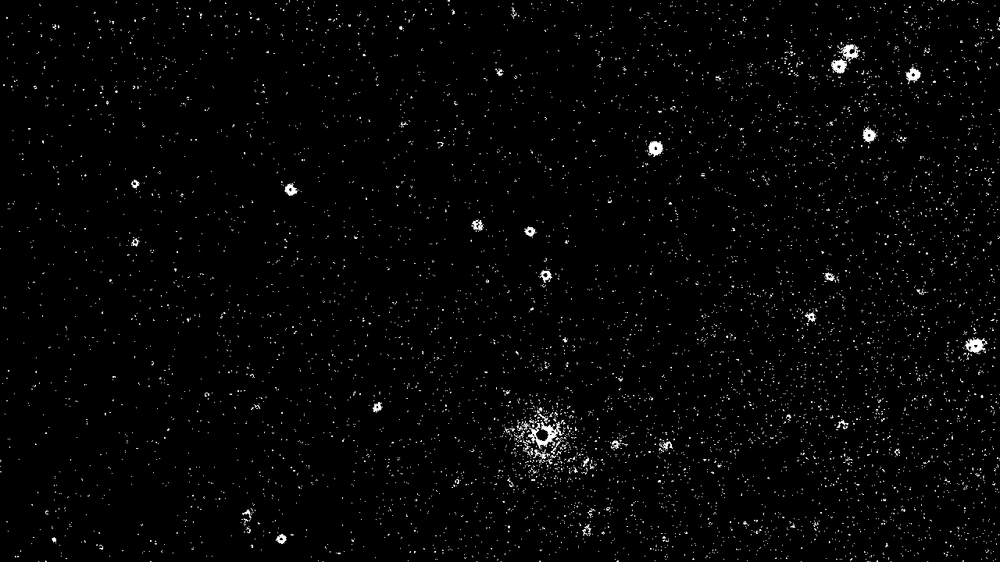

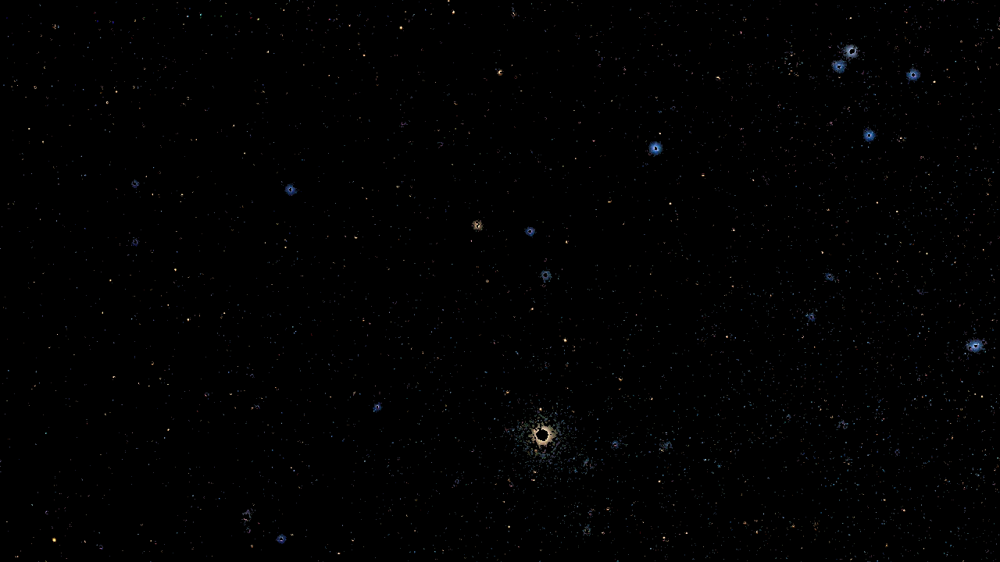

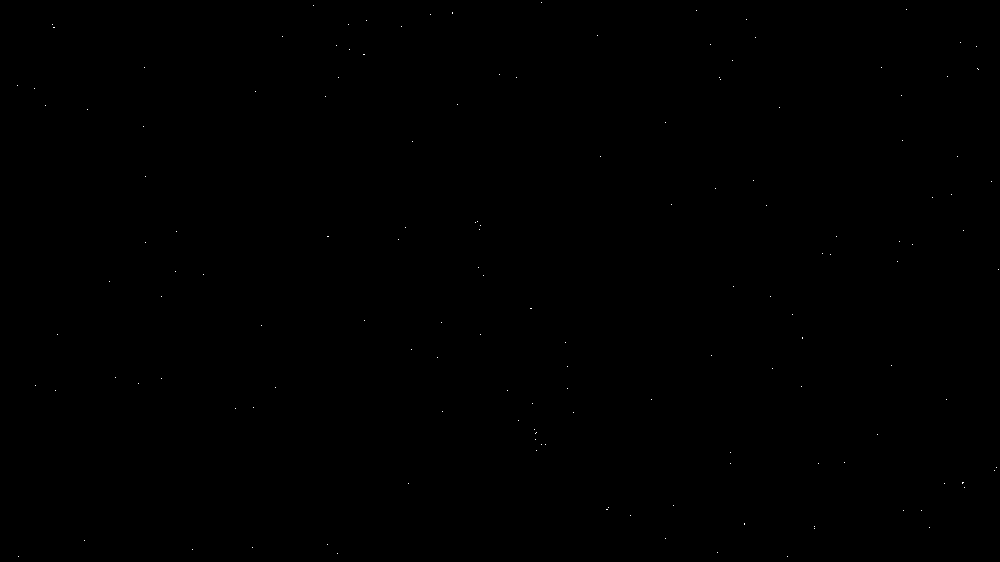

...

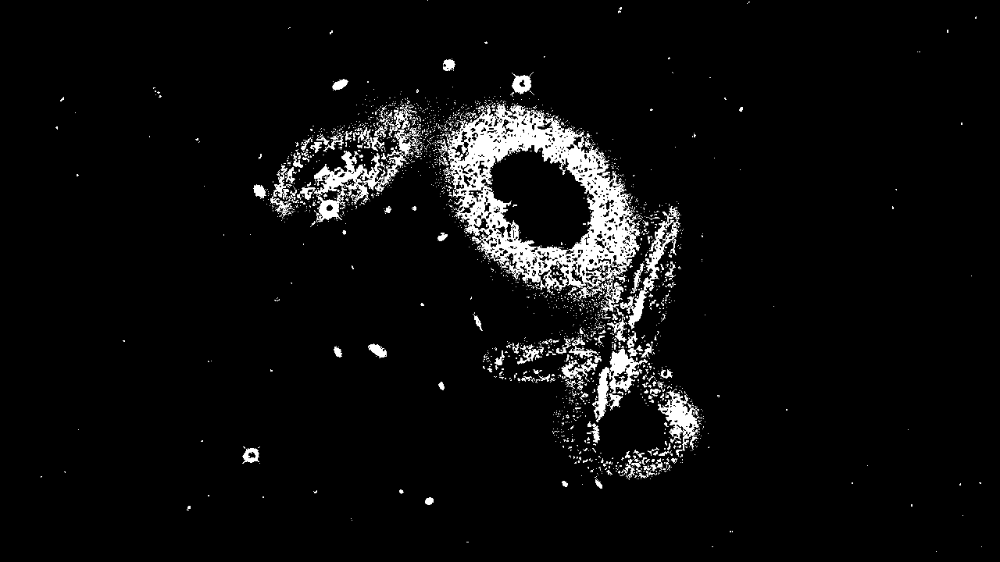

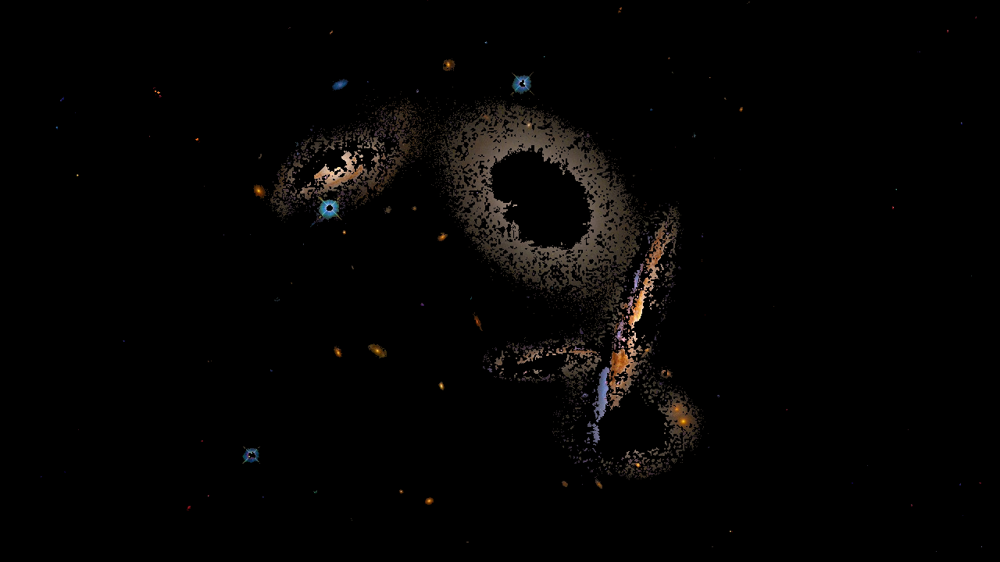

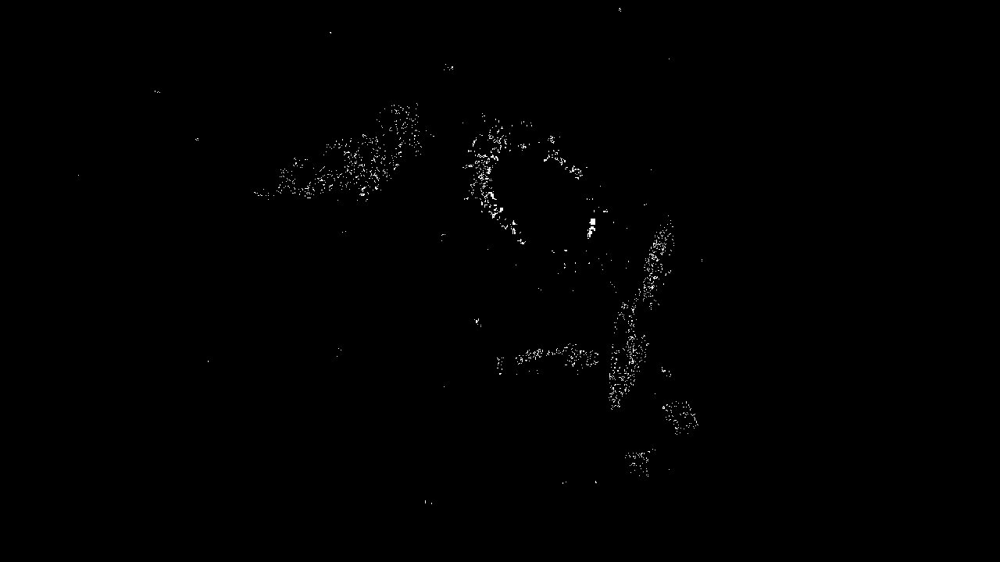

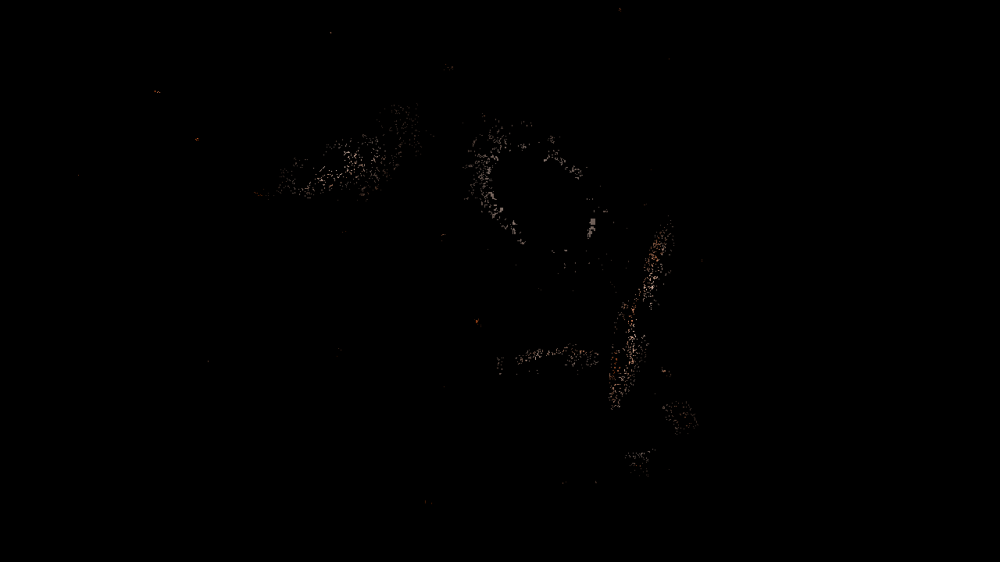

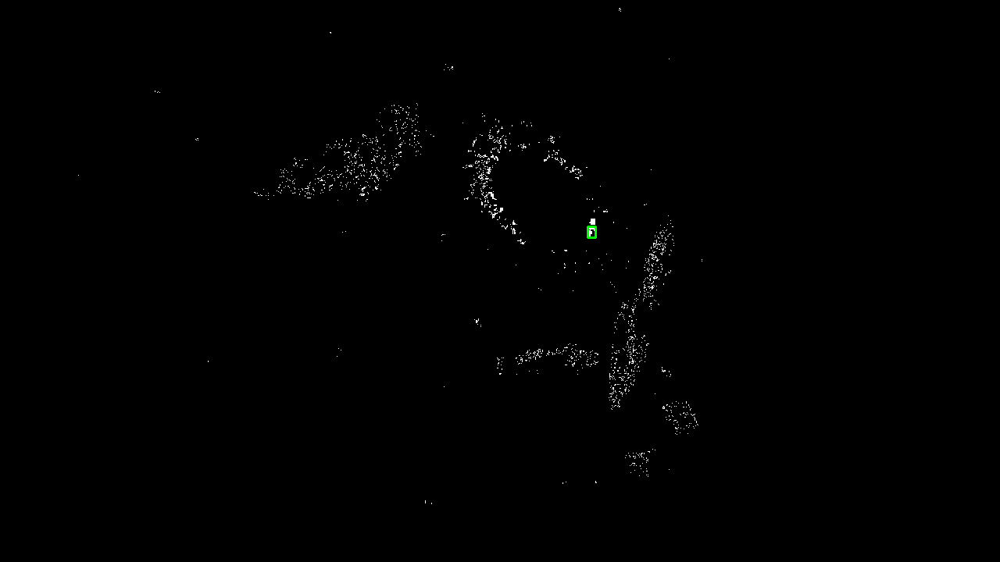

In [19]:
midi_notes=[50, 66, 88]
midifreq = np.array(midi_notes)
df1 = pd.DataFrame({"midinotes":midifreq})

midi = pretty_midi.PrettyMIDI()
instrument = pretty_midi.Instrument(0)


for i in range(0, frame_number, 30):
  image_path = f'/content/frame_{i:04d}.jpg'
  mask_yellow(image_path)
  mask_red(image_path)
  mask_blue(image_path)

  def convert_to_audio(masked_image):
    objects = get_objects(masked_image)

    df2 = pd.DataFrame({'size':objects})

    merged_df = merge_dfs_blue(df1, df2)

    midi_array = merged_df['midinotes'].to_numpy()

    for note in midi_array:
          note_on = pretty_midi.Note(
              velocity=100,
              pitch=note,
              start=i / 30.0,
              end=(i / 30.0) + 1
          )
          instrument.notes.append(note_on)

  convert_to_audio("masked_image1.jpg")

midi.instruments.append(instrument)


midi.write('_output-blue.mid')

subprocess.run(["fluidsynth", "-ni", "FantasyPiano.sf2", "_output-blue.mid", "-F", "_output-blue.wav"])


audio = AudioSegment.from_wav("_output-blue.wav")

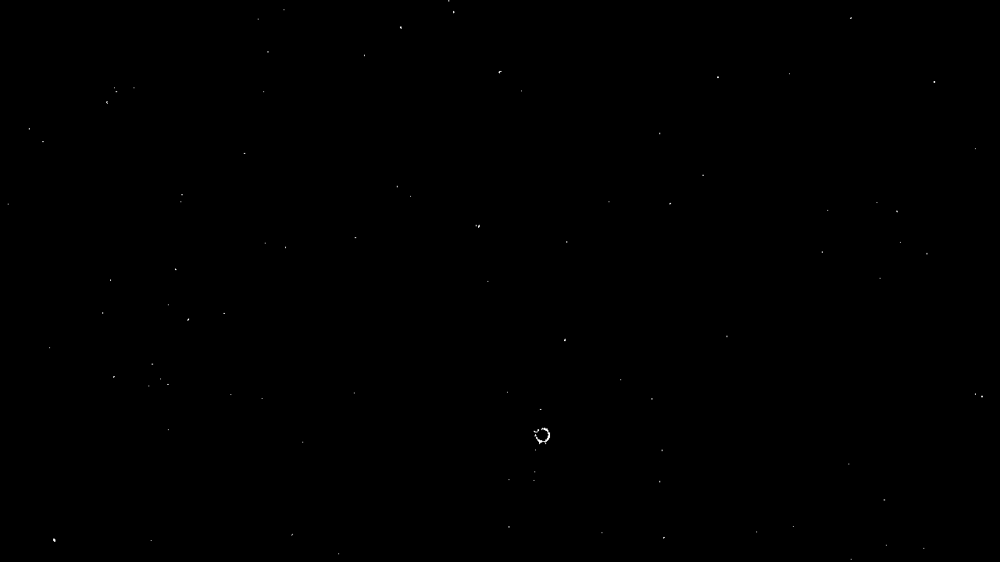

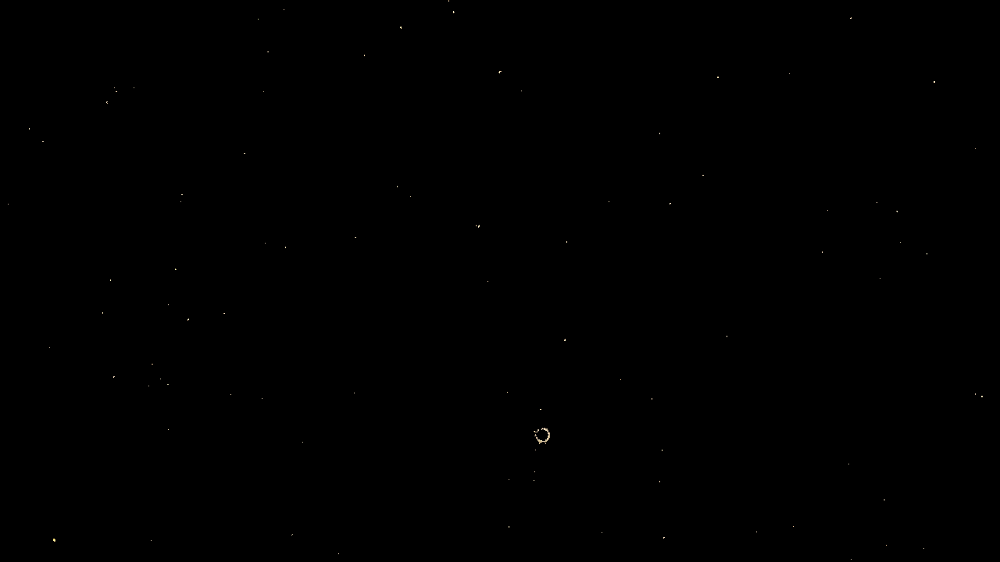

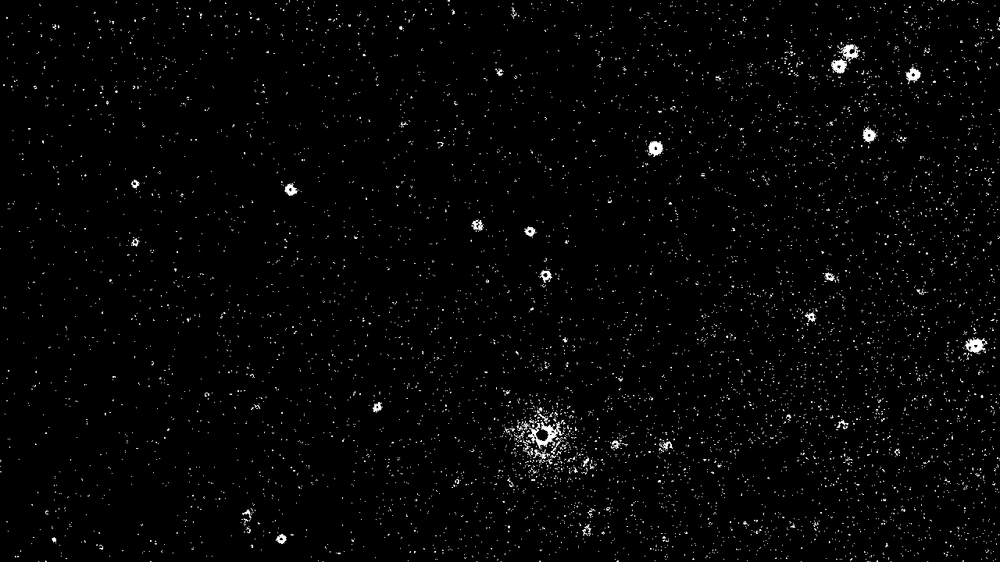

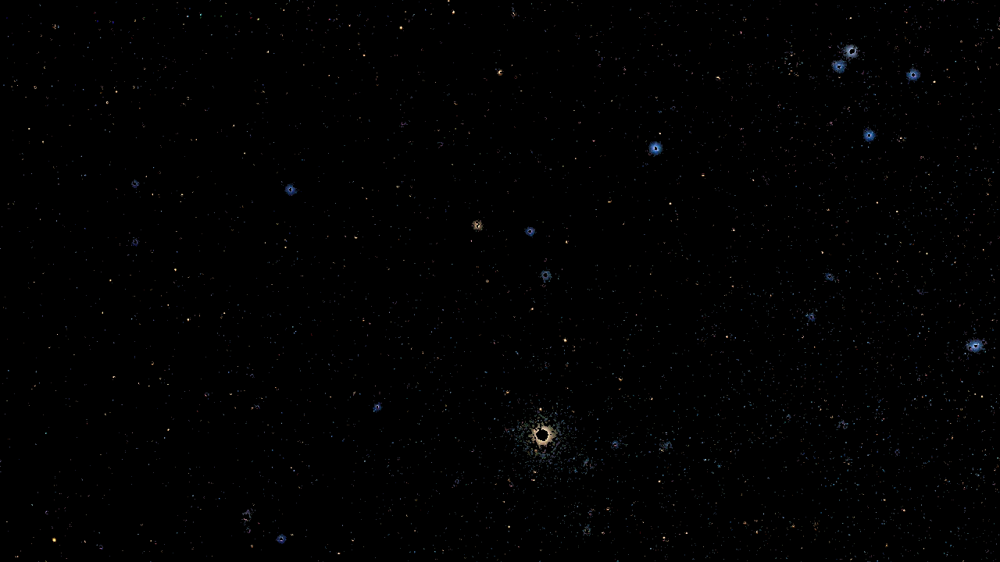

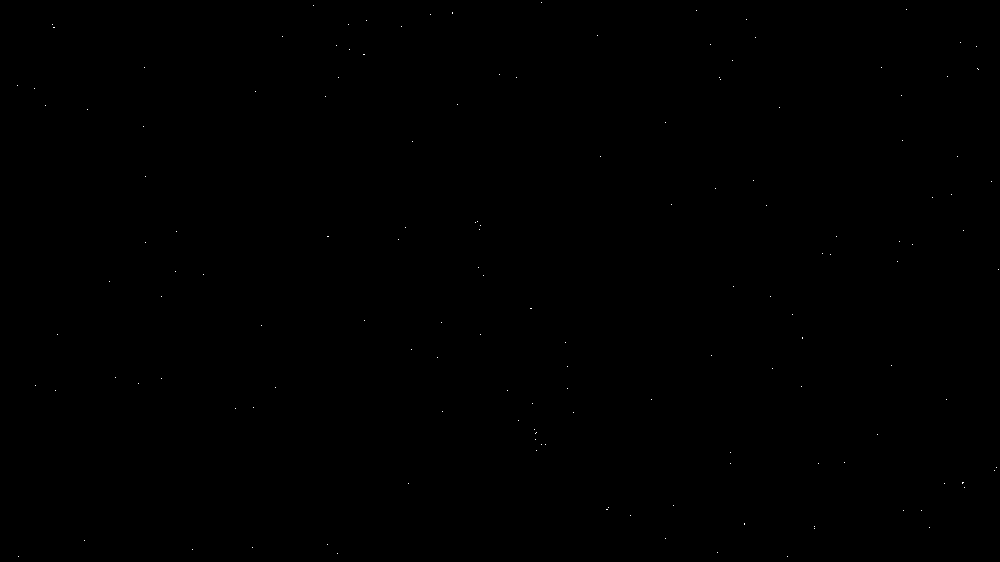

...

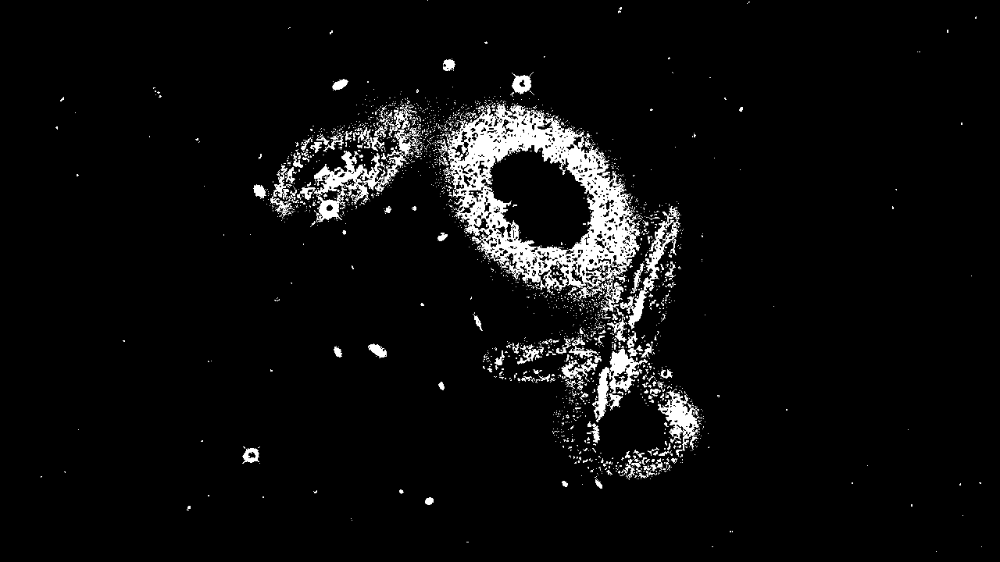

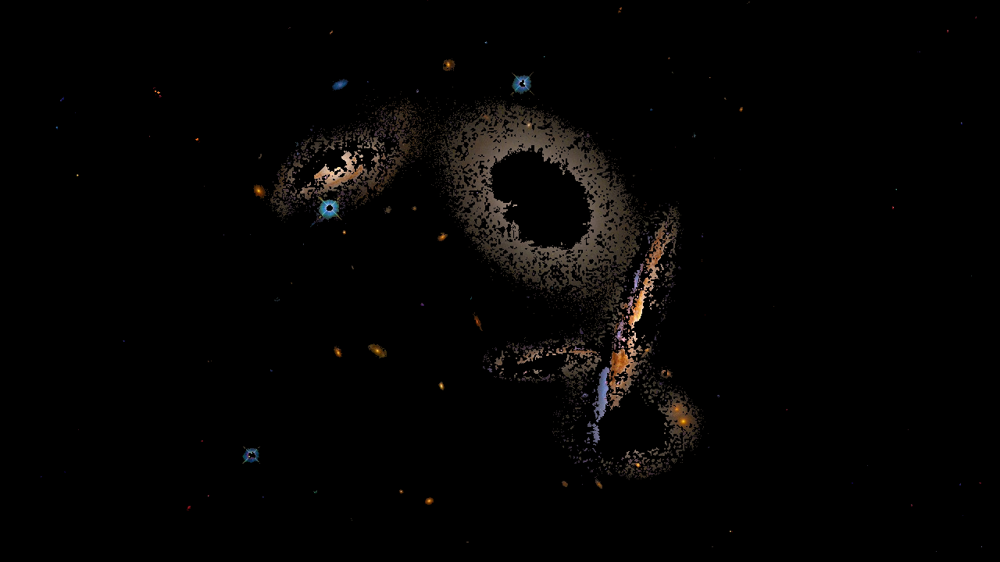

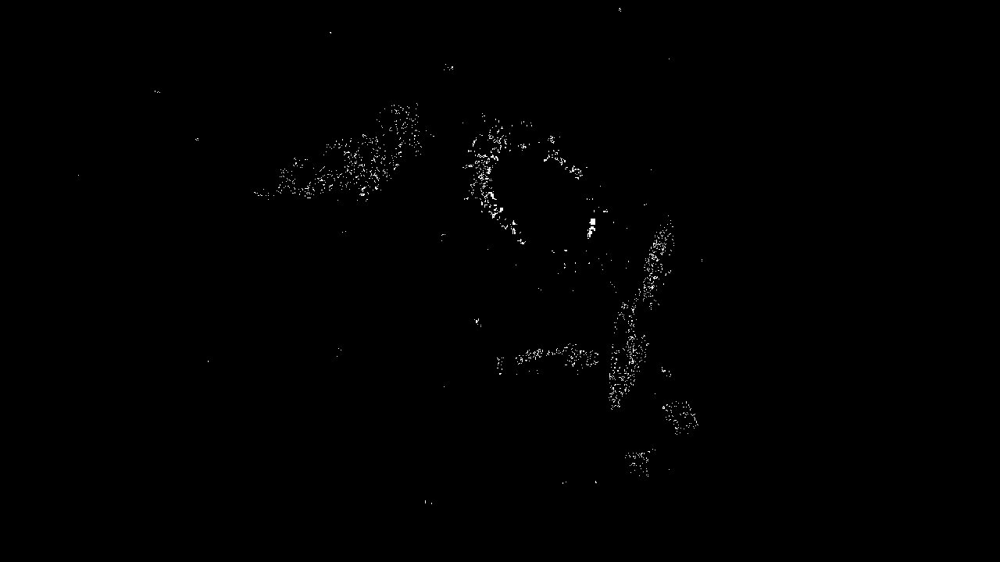

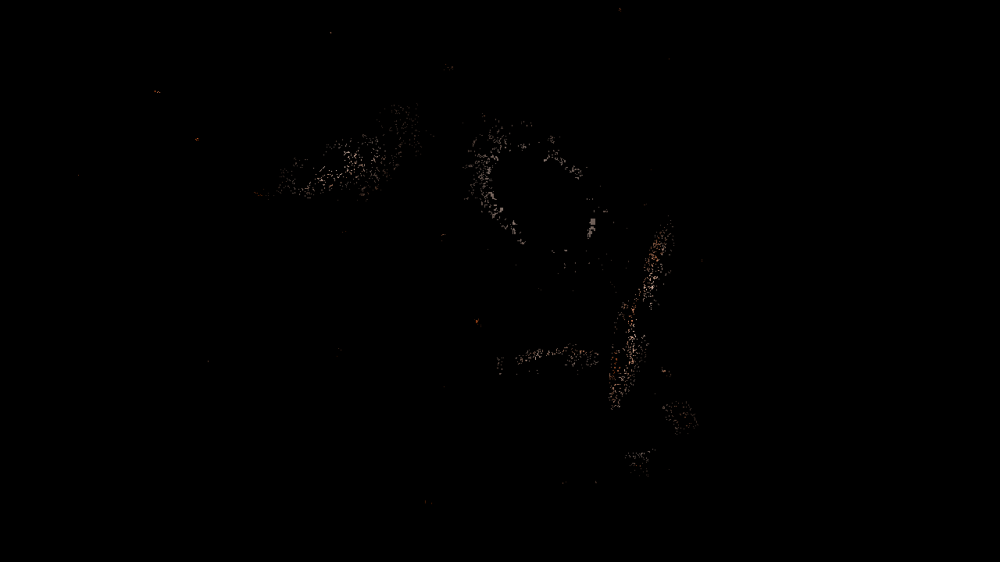

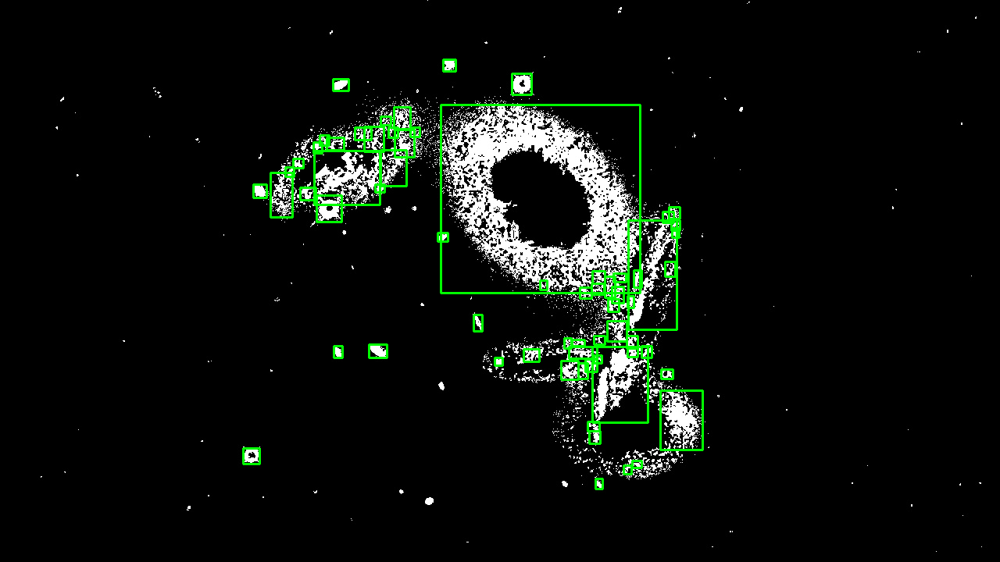

In [20]:
midi_notes=[25, 33, 44] # red * 2
midifreq = np.array(midi_notes)
df1 = pd.DataFrame({"midinotes":midifreq})

midi = pretty_midi.PrettyMIDI()
instrument = pretty_midi.Instrument(0)


for i in range(0, frame_number, 30):
  image_path = f'/content/frame_{i:04d}.jpg'
  mask_yellow(image_path)
  mask_red(image_path)
  mask_blue(image_path)

  def convert_to_audio(masked_image):
    objects = get_objects(masked_image)

    df2 = pd.DataFrame({'size':objects})

    merged_df = merge_dfs_red(df1, df2)

    midi_array = merged_df['midinotes'].to_numpy()

    for note in midi_array:
          note_on = pretty_midi.Note(
              velocity=100,
              pitch=note,
              start=i / 30.0,
              end=(i / 30.0) + 1
          )
          instrument.notes.append(note_on)

  convert_to_audio("masked_image2.jpg")

midi.instruments.append(instrument)


midi.write('_output-red.mid')

subprocess.run(["fluidsynth", "-ni", "FantasyPiano.sf2", "_output-red.mid", "-F", "_output-red.wav"])

audio = AudioSegment.from_wav("_output-red.wav")